# 1. Exploratory data analysis

In [45]:
# File path
richtingen = "D:/KUL MSDS 1/mda_project/data/richtingen.csv"
sites = "D:/KUL MSDS 1/mda_project/data/sites.csv"
traffic_path = r"D:\KUL MSDS 1\mda_project\data\traffic" 

import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [46]:
pd.options.display.max_columns=1000
pd.options.display.max_rows=1000

## 1.1. Richtingen dataset

In [47]:
rich_df = pd.read_csv(richtingen, header=None)
rich_df.columns = ["siteid", "richting", "naam"]
rich_df.head()

,siteid,richting,naam
0,1,IN,Machelen Cyclists rich. Brucargo
1,1,OUT,Machelen Cyclists richting Machelen
2,2,IN,Brasschaat 2 Fietsers rich Merksem
3,2,OUT,Brasschaat 2 Fietsers rich Brasschaat
4,3,IN,Brasschaat 1 Fietsers rich Merksem


In [48]:
rich_df.shape # total: 305 rows before filtering IN/ OUT issues

(305, 3)

In [49]:
siteid_counts = rich_df["siteid"].value_counts()
siteid_counts

siteid
1      3
7      3
34     3
102    3
5      2
4      2
2      2
10     2
19     2
21     2
20     2
23     2
24     2
25     2
22     2
26     2
27     2
29     2
28     2
30     2
31     2
6      2
3      2
33     2
32     2
36     2
35     2
38     2
144    2
145    2
37     2
9      2
11     2
12     2
13     2
14     2
15     2
16     2
8      2
18     2
39     2
40     2
44     2
45     2
46     2
47     2
48     2
49     2
50     2
51     2
52     2
53     2
54     2
55     2
17     2
42     2
43     2
56     2
57     2
58     2
59     2
60     2
61     2
62     2
63     2
78     2
79     2
80     2
81     2
82     2
83     2
84     2
85     2
86     2
87     2
88     2
89     2
90     2
64     2
65     2
66     2
67     2
68     2
69     2
70     2
77     2
41     2
91     2
92     2
94     2
93     2
96     2
97     2
98     2
95     2
99     2
100    2
101    2
105    2
106    2
107    2
108    2
109    2
110    2
71     2
72     2
73     2
74     2
75     2
76     2
103

In [50]:
unpaired_sites = siteid_counts[siteid_counts != 2].index.tolist()
unpaired_sites # 4 sites missing an IN or OUT partner row (7, 102, 34, 141)

[1, 7, 34, 102, 141]

In [51]:
rich_df['from'] = rich_df['naam'].apply(lambda x: x.split()[0])
rich_df['to'] = rich_df['naam'].apply(lambda x: x.split()[-1])

rich_df[['from','to']].drop_duplicates().tail(20)

,from,to
284,YTH17062596,IN
285,YTH17062596,OUT
286,Overijse,UIT
287,Overijse,IN]
288,Overijse,OUT]
289,Overijse,Ijsebos]
290,Test,IN
291,TEST,IN
292,TEST,UIT
294,Overijse,Nieuwland]


In [52]:
rich_df = rich_df.query('richting!="IN/OUT"') # filter out side id with error IN and OUT
print(rich_df.shape) # total 301 rows
print(rich_df['siteid'].nunique()) # there are 151 unique site IDs in the dataset

(301, 5)
151


In [53]:
# Missing values
rich_df.isna().sum()

siteid      0
richting    0
naam        0
from        0
to          0
dtype: int64

## 1.2. Sites dataset

In [54]:
sites_df = pd.read_csv(sites, header=None)
sites_df.columns = ['siteid', 'sitenr', 'long', 'lat', 'naam', 'domein', 'wegnr', 'district', 'gemeente', 'interval', 'datum_van']
sites_df.head()

,siteid,sitenr,long,lat,naam,domein,wegnr,district,gemeente,interval,datum_van
0,1,100046096,4.456122,50.916183,Machelen,Vlaamse Overheid A. Wegen enVerkeer,T2110002,AWV212,Machelen,15,2019-08-22
1,2,100052862,4.471690,51.275120,Brasschaat 2,Vlaamse Overheid A. Wegen enVerkeer,N0010002,AWV123,Brasschaat,15,2019-08-22
2,3,100052863,4.472220,51.275030,Brasschaat 1,Vlaamse Overheid A. Wegen enVerkeer,N0010001,AWV123,Brasschaat,15,2019-08-22
3,4,100052864,5.190110,51.160230,Balen 1,Vlaamse Overheid A. Wegen enVerkeer,N0180002,AWV114,Balen,15,2019-08-22
4,5,100052865,5.190030,51.160180,Balen 2,Vlaamse Overheid A. Wegen enVerkeer,N0180002,AWV114,Balen,15,2019-08-22


In [55]:
sites_df.shape

(151, 11)

In [56]:
sites_df['domein'].value_counts()

domein
Vlaamse Overheid A. Wegen enVerkeer     142
Vlaamse Overheid A. Wegen en Verkeer      8
Kortrijk Fietst                           1
Name: count, dtype: int64

In [57]:
sites_df.describe()

,siteid,sitenr,long,lat,interval
count,151.000000,1.510000e+02,151.000000,151.000000,151.000000
mean,76.145695,2.655954e+08,4.364879,51.010527,14.801325
std,43.951245,7.575055e+07,0.810268,0.154309,4.578238
min,1.000000,1.000389e+08,2.742890,50.751280,0.000000
25%,38.500000,3.000235e+08,3.768264,50.886897,15.000000
50%,76.000000,3.000256e+08,4.471690,50.990394,15.000000
75%,113.500000,3.000273e+08,4.937732,51.134365,15.000000
max,152.000000,3.000621e+08,5.797260,51.357520,60.000000


In [58]:
sites_df['wegnr'].apply(lambda x: str(x)[0]).unique()

array(['T', 'N', 'R', 'A', 'n'], dtype=object)

In [59]:
sites_df[['siteid','long','lat','naam']].rename(columns={'long':'longtitude','lat':'latitude',}).to_csv('D:\KUL MSDS 1\mda_project\data\site_latlong.csv', index=False)

In [60]:
print(sites_df['datum_van'].min())
print(sites_df['datum_van'].max())

2019-08-22
2025-10-31


In [61]:
print(sites_df['siteid'].nunique())
print(sites_df['sitenr'].nunique())

151
151


In [62]:
# Missing values
print(sites_df.isna().sum()) # wegnr and district have 3 missing values, and gemeente has 1 missing values
# Replace missing values 
sites_df["wegnr"] = sites_df["wegnr"].fillna("Unknown")
sites_df["district"] = sites_df["district"].fillna("Unknown")
sites_df["gemeente"] = sites_df["gemeente"].fillna("Unknown")

siteid       0
sitenr       0
long         0
lat          0
naam         0
domein       0
wegnr        3
district     3
gemeente     1
interval     0
datum_van    0
dtype: int64


In [63]:
# Check again after filling missing values
sites_df.isna().sum()

siteid       0
sitenr       0
long         0
lat          0
naam         0
domein       0
wegnr        0
district     0
gemeente     0
interval     0
datum_van    0
dtype: int64

### 1.2.1. Site overview and distribution

,year,active_unique_sites
0,2019,24
1,2020,25
2,2021,27
3,2022,129
4,2023,142
5,2024,143
6,2025,151


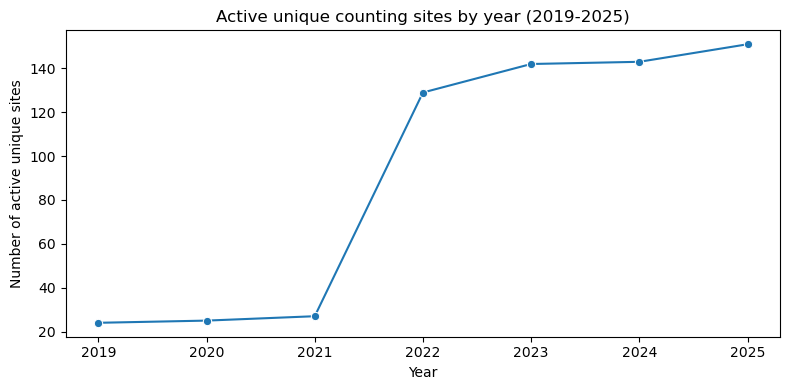

In [64]:
# Calculate active unique sites by year: determine how the number of available counting sites changes over time.

sites_df["datum_van"] = pd.to_datetime(sites_df["datum_van"], errors="coerce")
sites_df["start_year"] = sites_df["datum_van"].dt.year

years = sorted(sites_df["start_year"].dropna().unique())

active_sites_by_year = []

for year in years:
    active_sites = sites_df.loc[
        sites_df["start_year"] <= year, "siteid"
    ].nunique()
    
    active_sites_by_year.append({
        "year": int(year),
        "active_unique_sites": active_sites
    })

active_sites_by_year = pd.DataFrame(active_sites_by_year)

display(active_sites_by_year)

plt.figure(figsize=(8, 4))
sns.lineplot(
    data=active_sites_by_year,
    x="year",
    y="active_unique_sites",
    marker="o"
)
plt.title("Active unique counting sites by year (2019-2025)")
plt.xlabel("Year")
plt.ylabel("Number of active unique sites")
plt.tight_layout()
plt.show()

,gemeente,number_of_sites
0,Brugge,7
1,Leuven,6
2,Kortrijk,5
3,District Vilvoorde-gewestwegen,4
4,Nieuwpoort,4
5,Westerlo,4
6,Gent,4
7,Aalst,3
8,Lokeren,3
9,Tienen,3


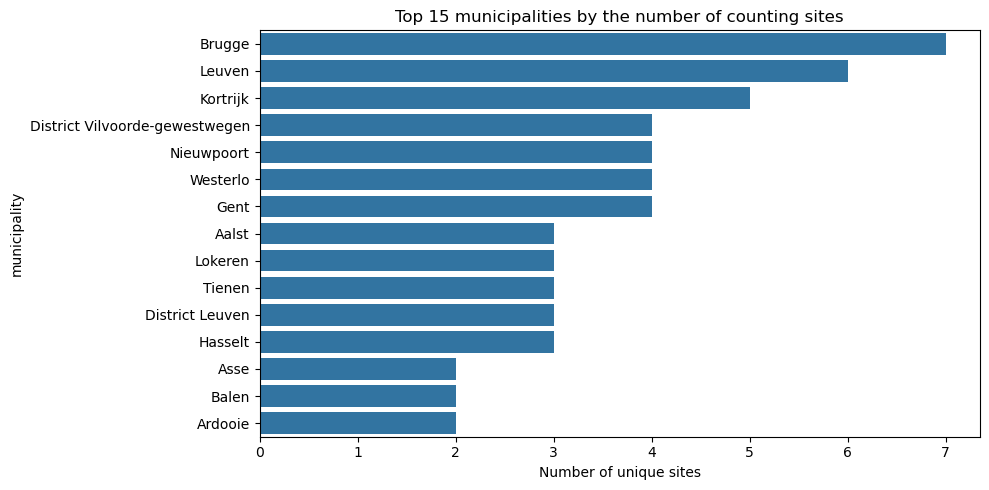

In [65]:
# Counting sites by municipalities

site_distribution = (
    sites_df.groupby("gemeente")["siteid"]
    .nunique()
    .sort_values(ascending=False)
    .head(15)
    .reset_index(name="number_of_sites")
)

display(site_distribution)

plt.figure(figsize=(10, 5))
sns.barplot(data=site_distribution, x="number_of_sites", y="gemeente")
plt.title("Top 15 municipalities by the number of counting sites")
plt.xlabel("Number of unique sites")
plt.ylabel("municipality")
plt.tight_layout()
plt.show() #  Brugge, Leuven, Kortrijk have a slightly higher of sites than other cities in top 10

In [66]:
# Number of municipalities
sites_df['gemeente'].nunique()

72

## 1.3. Traffic dataset

In [67]:
total_files = 0
total_rows = 0

for file in os.listdir(traffic_path):
    if file.startswith("data"):
        filepath = os.path.join(traffic_path, file)
        df = pd.read_csv(filepath, header=None)
        print(file, df.shape)
        total_files += 1
        total_rows += len(df)

print(f"\nTotal files: {total_files}")
print(f"Total rows: {total_rows}")

data-2019-08.csv (123148, 6)
data-2019-09.csv (138240, 6)
data-2019-10.csv (142848, 6)
data-2019-11.csv (138240, 6)
data-2019-12.csv (142848, 6)
data-2020-01.csv (142848, 6)
data-2020-02.csv (133632, 6)
data-2020-03.csv (142656, 6)
data-2020-04.csv (144000, 6)
data-2020-05.csv (148800, 6)
data-2020-06.csv (144000, 6)
data-2020-07.csv (148800, 6)
data-2020-08.csv (148800, 6)
data-2020-09.csv (144000, 6)
data-2020-10.csv (148800, 6)
data-2020-11.csv (144000, 6)
data-2020-12.csv (148800, 6)
data-2021-01.csv (148800, 6)
data-2021-02.csv (134400, 6)
data-2021-03.csv (148600, 6)
data-2021-04.csv (144000, 6)
data-2021-05.csv (148800, 6)
data-2021-06.csv (144000, 6)
data-2021-07.csv (156864, 6)
data-2021-08.csv (160704, 6)
data-2021-09.csv (155520, 6)
data-2021-10.csv (160704, 6)
data-2021-11.csv (155520, 6)
data-2021-12.csv (160704, 6)
data-2022-01.csv (160704, 6)
data-2022-02.csv (145152, 6)
data-2022-03.csv (203704, 6)
data-2022-04.csv (267250, 6)
data-2022-05.csv (368518, 6)
data-2022-06.c

In [68]:
# Calculate missing values 

traffic_columns = ["siteid", "richting", "type", "van", "tot", "aantal"]

missing_summary = pd.Series(0, index=traffic_columns)
total_rows = 0
total_files = 0

for file in os.listdir(traffic_path):
    if file.startswith("data") and file.endswith(".csv"):
        filepath = os.path.join(traffic_path, file)

        df = pd.read_csv(filepath, header=None, names=traffic_columns)

        # Convert empty/blank strings into missing values only for checking
        df = df.replace(r"^\s*$", pd.NA, regex=True)

        total_rows += len(df)
        total_files += 1

        missing_summary += df.isna().sum()


print("\nMissing values before cleaning:")
print(missing_summary)



Missing values before cleaning:
siteid            0
richting          0
type              0
van               0
tot               0
aantal      1068571
dtype: int64


In [69]:
# Clean all traffic files: convert columns, remove invalid timestamps, and fill missing counts with 0 

traffic_columns = ["siteid", "richting", "type", "van", "tot", "aantal"]

cleaned_list = []

for file in os.listdir(traffic_path):
    if file.startswith("data") and file.endswith(".csv"):
        filepath = os.path.join(traffic_path, file)
        df = pd.read_csv(filepath, header=None, names=traffic_columns)

        # Convert to correct formats
        df["van"] = pd.to_datetime(df["van"], errors="coerce")
        df["tot"] = pd.to_datetime(df["tot"], errors="coerce")
        df["aantal"] = pd.to_numeric(df["aantal"], errors="coerce")

        # Fill missing traffic counts with 0
        df["aantal"] = df["aantal"].fillna(0)

        # Drop rows where key identifiers or timestamps are missing
        df = df.dropna(subset=["siteid", "richting", "type", "van", "tot"])

        cleaned_list.append(df)

traffic_cleaned_all = pd.concat(cleaned_list, ignore_index=True)

print("Missing values after cleaning:") 
print(traffic_cleaned_all.isna().sum())

Missing values after cleaning:
siteid      0
richting    0
type        0
van         0
tot         0
aantal      0
dtype: int64


### 1.3.1. Monthly traffic pattern

How does cyclist traffic changes across the months?

,year,month,total_cyclist_traffic,year_month
0,2019,8,274894.0,2019-08-01
1,2019,9,343393.0,2019-09-01
2,2019,10,286475.0,2019-10-01
3,2019,11,238230.0,2019-11-01
4,2019,12,198679.0,2019-12-01


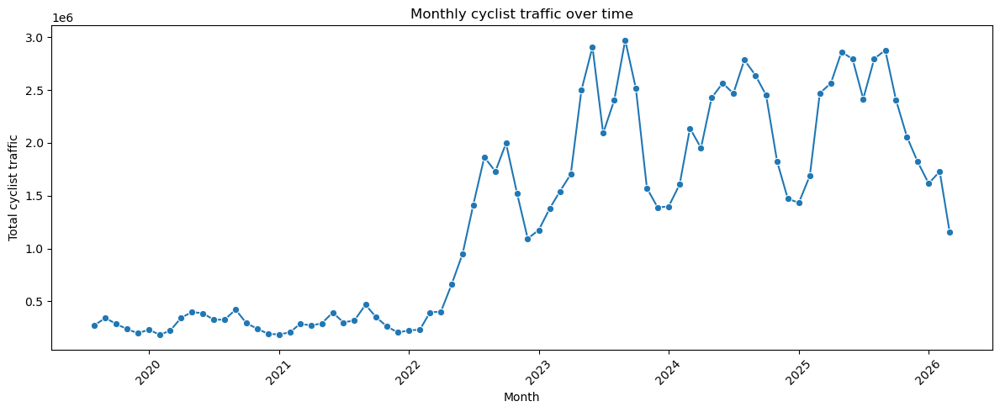

In [70]:
# How does cyclist traffic change across months?

traffic_columns = ["siteid", "richting", "type", "van", "tot", "aantal"]
monthly_list = []

for file in os.listdir(traffic_path):
    if file.startswith("data") and file.endswith(".csv"):
        filepath = os.path.join(traffic_path, file)
        df = pd.read_csv(filepath, header=None, names=traffic_columns)

        df["van"] = pd.to_datetime(df["van"], errors="coerce")
        df["aantal"] = pd.to_numeric(df["aantal"], errors="coerce")

        df = df[df["van"].notna()]
        df = df[df["aantal"].notna()]
        df = df[df["type"].astype(str).str.upper().eq("FIETSERS")]

        df["year"] = df["van"].dt.year
        df["month"] = df["van"].dt.month

        monthly_agg = (
            df.groupby(["year", "month"], as_index=False)["aantal"]
            .sum()
            .rename(columns={"aantal": "total_cyclist_traffic"})
        )

        monthly_list.append(monthly_agg)

monthly_traffic = pd.concat(monthly_list, ignore_index=True)
monthly_traffic = (
    monthly_traffic.groupby(["year", "month"], as_index=False)["total_cyclist_traffic"]
    .sum()
)

monthly_traffic["year_month"] = pd.to_datetime(
    monthly_traffic["year"].astype(str) + "-" + monthly_traffic["month"].astype(str) + "-01"
)

display(monthly_traffic.head())

plt.figure(figsize=(12, 5))
sns.lineplot(data=monthly_traffic, x="year_month", y="total_cyclist_traffic", marker="o")
plt.title("Monthly cyclist traffic over time")
plt.xlabel("Month")
plt.ylabel("Total cyclist traffic")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show() # Monthly cyclist traffic shows a clear increase from 2022 onward, though fluctuated and decreased gradually since 2026

In [71]:
# Explore traffic: data-2026-03
march2026_df = pd.read_csv("D:/KUL MSDS 1/mda_project/data/traffic/data-2026-03.csv", header=0)
march2026_df.columns=['siteid', 'richting', 'type', 'van', 'tot', 'aantal']
print(march2026_df.shape)
print(march2026_df.head())

(351505, 6)
   siteid richting      type                    van                    tot  \
0       1       IN  FIETSERS  2026-03-01 00:15:00.0  2026-03-01 00:30:00.0   
1       1       IN  FIETSERS  2026-03-01 00:30:00.0  2026-03-01 00:45:00.0   
2       1       IN  FIETSERS  2026-03-01 00:45:00.0  2026-03-01 01:00:00.0   
3       1       IN  FIETSERS  2026-03-01 01:00:00.0  2026-03-01 01:15:00.0   
4       1       IN  FIETSERS  2026-03-01 01:15:00.0  2026-03-01 01:30:00.0   

   aantal  
0     0.0  
1     0.0  
2     0.0  
3     1.0  
4     0.0  


In [72]:
march2026_df.info

<bound method DataFrame.info of         siteid richting      type                    van  \
0            1       IN  FIETSERS  2026-03-01 00:15:00.0   
1            1       IN  FIETSERS  2026-03-01 00:30:00.0   
2            1       IN  FIETSERS  2026-03-01 00:45:00.0   
3            1       IN  FIETSERS  2026-03-01 01:00:00.0   
4            1       IN  FIETSERS  2026-03-01 01:15:00.0   
...        ...      ...       ...                    ...   
351500     152      OUT  FIETSERS  2026-03-13 03:45:00.0   
351501     152      OUT  FIETSERS  2026-03-13 04:00:00.0   
351502     152      OUT  FIETSERS  2026-03-13 04:15:00.0   
351503     152      OUT  FIETSERS  2026-03-13 04:30:00.0   
351504     152      OUT  FIETSERS  2026-03-13 04:45:00.0   

                          tot  aantal  
0       2026-03-01 00:30:00.0     0.0  
1       2026-03-01 00:45:00.0     0.0  
2       2026-03-01 01:00:00.0     0.0  
3       2026-03-01 01:15:00.0     1.0  
4       2026-03-01 01:30:00.0     0.0  
...    

In [73]:
march2026_df.describe()

,siteid,aantal
count,351505.000000,349465.000000
mean,74.746996,3.307064
std,43.689207,8.681137
min,1.000000,0.000000
25%,37.000000,0.000000
50%,74.000000,0.000000
75%,112.000000,3.000000
max,152.000000,266.000000


In [74]:
# Define function time of day
def time_of_day(dt):
    if pd.isna(dt):
        return "Unknown"
    hour = dt.hour
    if 6 <= hour < 12:
        return "morning"
    elif 12 <= hour < 18:
        return "afternoon"
    elif 18 <= hour < 22:
        return "evening"
    else:
        return "night"

march2026_df['van'] = pd.to_datetime(march2026_df['van'])
march2026_df['tot'] = pd.to_datetime(march2026_df['tot'])
march2026_df['duration'] = (march2026_df['tot'] - march2026_df['van']).dt.total_seconds() / 60
march2026_df['tod'] = march2026_df['van'].apply(time_of_day)
march2026_df['date'] = march2026_df['van'].apply(lambda x: str(x)[:10])
march2026_df['hour'] = march2026_df['van'].dt.hour
march2026_df['dow'] = march2026_df['van'].dt.day_name()
march2026_df['weekend'] = march2026_df['dow'].isin(['Saturday', 'Sunday']).astype(int)

march2026_df

,siteid,richting,type,van,tot,aantal,duration,tod,date,hour,dow,weekend
0,1,IN,FIETSERS,2026-03-01 00:15:00,2026-03-01 00:30:00,0.0,15.0,night,2026-03-01,0,Sunday,1
1,1,IN,FIETSERS,2026-03-01 00:30:00,2026-03-01 00:45:00,0.0,15.0,night,2026-03-01,0,Sunday,1
2,1,IN,FIETSERS,2026-03-01 00:45:00,2026-03-01 01:00:00,0.0,15.0,night,2026-03-01,0,Sunday,1
3,1,IN,FIETSERS,2026-03-01 01:00:00,2026-03-01 01:15:00,1.0,15.0,night,2026-03-01,1,Sunday,1
4,1,IN,FIETSERS,2026-03-01 01:15:00,2026-03-01 01:30:00,0.0,15.0,night,2026-03-01,1,Sunday,1
...,...,...,...,...,...,...,...,...,...,...,...,...
351500,152,OUT,FIETSERS,2026-03-13 03:45:00,2026-03-13 04:00:00,0.0,15.0,night,2026-03-13,3,Friday,0
351501,152,OUT,FIETSERS,2026-03-13 04:00:00,2026-03-13 04:15:00,0.0,15.0,night,2026-03-13,4,Friday,0
351502,152,OUT,FIETSERS,2026-03-13 04:15:00,2026-03-13 04:30:00,0.0,15.0,night,2026-03-13,4,Friday,0
351503,152,OUT,FIETSERS,2026-03-13 04:30:00,2026-03-13 04:45:00,0.0,15.0,night,2026-03-13,4,Friday,0


In [75]:
march2026_df.query('siteid == 1 and richting == "IN" and date == @pd.to_datetime("2019-08-01").date()')['van'].nunique()

0

### 1.3.1. Aggregate traffic by hour

In [76]:
traffic_agg_hour = march2026_df.groupby(['siteid', 'richting', 'type', 'tod', 'hour', 'dow', 'weekend', 'date']).agg({'aantal':'sum'}).reset_index()
print(traffic_agg_hour.shape)
traffic_agg_hour.head()

(87974, 9)


,siteid,richting,type,tod,hour,dow,weekend,date,aantal
0,1,IN,FIETSERS,afternoon,12,Friday,0,2026-03-06,14.0
1,1,IN,FIETSERS,afternoon,12,Monday,0,2026-03-02,12.0
2,1,IN,FIETSERS,afternoon,12,Monday,0,2026-03-09,13.0
3,1,IN,FIETSERS,afternoon,12,Saturday,1,2026-03-07,10.0
4,1,IN,FIETSERS,afternoon,12,Sunday,1,2026-03-01,10.0


In [77]:
traffic_agg_hour.describe()

,siteid,hour,weekend,aantal
count,87974.000000,87974.000000,87974.000000,87974.00000
mean,74.741401,11.392070,0.240776,13.13687
std,43.686589,6.963249,0.427557,31.09829
min,1.000000,0.000000,0.000000,0.00000
25%,37.000000,5.000000,0.000000,0.00000
50%,74.000000,11.000000,0.000000,2.00000
75%,112.000000,17.000000,0.000000,13.00000
max,152.000000,23.000000,1.000000,575.00000


In [78]:
traffic_agg_hour[traffic_agg_hour['aantal']>250].shape[0]/traffic_agg_hour.shape[0]

0.0026826107713642665

### 1.3.2. Combine: traffic aggregation + richting

In [79]:
traffic_agg_rich = traffic_agg_hour.merge(rich_df, on=['siteid','richting'])
print(traffic_agg_rich.shape)
traffic_agg_rich.head()

(87974, 12)


,siteid,richting,type,tod,hour,dow,weekend,date,aantal,naam,from,to
0,1,IN,FIETSERS,afternoon,12,Friday,0,2026-03-06,14.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
1,1,IN,FIETSERS,afternoon,12,Monday,0,2026-03-02,12.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
2,1,IN,FIETSERS,afternoon,12,Monday,0,2026-03-09,13.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
3,1,IN,FIETSERS,afternoon,12,Saturday,1,2026-03-07,10.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
4,1,IN,FIETSERS,afternoon,12,Sunday,1,2026-03-01,10.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo


In [80]:
traffic_agg_rich.query("siteid==1 and 'date'=='2026-03-01'").shape

(0, 12)

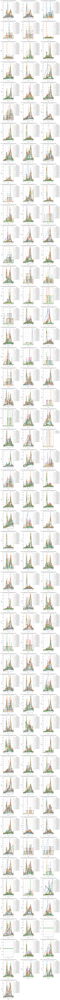

In [81]:
# Filter data for IN direction only
df_in = traffic_agg_rich[traffic_agg_rich['richting'] == 'IN']

import math
site_groups = list(df_in.groupby('siteid'))
n_sites = len(site_groups)
n_cols = 3
n_rows = math.ceil(n_sites / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows), squeeze=False)
axes_flat = axes.flat

for ax, (site_id, group) in zip(axes_flat, site_groups):
    for date, subg in group.groupby('date'):
        ax.plot(subg['hour'], subg['aantal'], marker='o', label=str(date))
    ax.set_title(f'Site {site_id}: Aantal per hour, per date (IN richting)')
    ax.set_xlabel('Hour')
    ax.set_ylabel('Aantal')
    ax.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.margins(x=0)
    ax.grid(True)

# Hide any unused subplots
for extra_ax in axes_flat[len(site_groups):]:
    extra_ax.axis('off')

plt.tight_layout()
plt.show()


### 1.3.3. Further exploration

#### 1.3.3.1. Preparing the Jan 2025 - Mar 2026 analysis dataset

This cell creates a focused hourly dataset for the period between 2025 and 2026 The same dataset is reused for the time-level and city-level analyses below, so the hourly, weekday/weekend, rush-hour, and city comparisons are based on a consistent time window.


Hourly aggregated observations: 2972964
Unique sites: 147
Time range: 2025-01-01 to 2026-03-14


,siteid,richting,date,year,month,hour,dow,weekend,total_traffic
0,1,IN,2025-01-01,2025,1,0,Wednesday,0,1.0
1,1,IN,2025-01-01,2025,1,1,Wednesday,0,1.0
2,1,IN,2025-01-01,2025,1,2,Wednesday,0,2.0
3,1,IN,2025-01-01,2025,1,3,Wednesday,0,1.0
4,1,IN,2025-01-01,2025,1,4,Wednesday,0,0.0


,siteid,richting,date,year,month,hour,dow,weekend,total_traffic,gemeente,naam,district
0,1,IN,2025-01-01,2025,1,0,Wednesday,0,1.0,Machelen,Machelen,AWV212
1,1,IN,2025-01-01,2025,1,1,Wednesday,0,1.0,Machelen,Machelen,AWV212
2,1,IN,2025-01-01,2025,1,2,Wednesday,0,2.0,Machelen,Machelen,AWV212
3,1,IN,2025-01-01,2025,1,3,Wednesday,0,1.0,Machelen,Machelen,AWV212
4,1,IN,2025-01-01,2025,1,4,Wednesday,0,0.0,Machelen,Machelen,AWV212


,gemeente,total_traffic
39,Leuven,4076309.0
36,Kortrijk,2567332.0
26,Hasselt,2563041.0
54,Nieuwpoort,1805964.0
23,Gent,1526891.0
13,Brugge,1339403.0
68,Westerlo,948087.0
15,Dendermonde,944414.0
71,Zemst,807287.0
49,Mechelen,772361.0


,gemeente,total_traffic
66,Wemmel,78605.0
44,Lummen,75911.0
62,Tongeren,57192.0
64,Unknown,55410.0
27,Heers,55231.0
7,Beersel,51006.0
40,Lier,33030.0
24,Halle,26044.0
53,Nazareth,26016.0
60,Sint-Pieters-Leeuw,18565.0


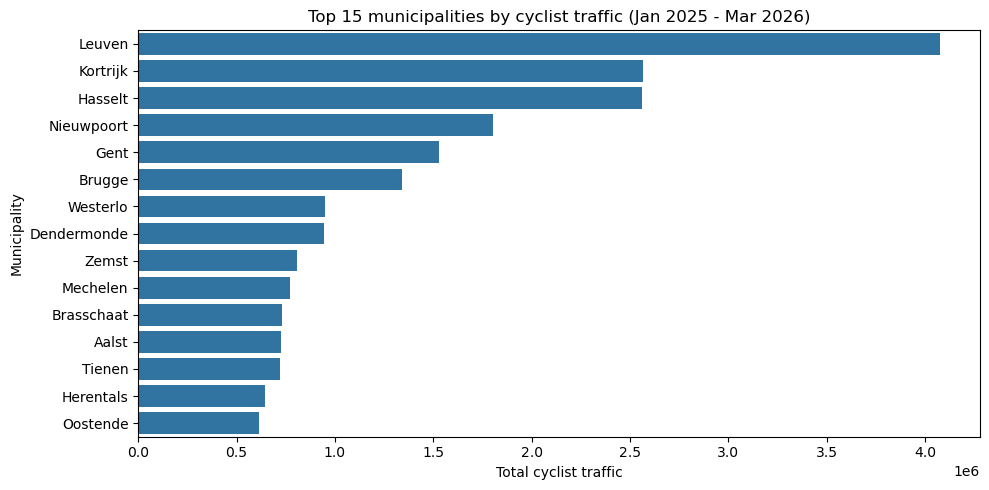

,gemeente,total_traffic
39,Leuven,4076309.0
36,Kortrijk,2567332.0
26,Hasselt,2563041.0
54,Nieuwpoort,1805964.0
23,Gent,1526891.0


,gemeente,total_traffic
7,Beersel,51006.0
40,Lier,33030.0
24,Halle,26044.0
53,Nazareth,26016.0
60,Sint-Pieters-Leeuw,18565.0


,siteid,naam,gemeente,district
12,13,Gent,Gent,AWV411
117,118,Gent teller 1,Gent,AWV411
118,119,Gent teller 2,Gent,AWV411
135,136,Gent R4,Gent,AWV411
136,137,Hasselt-Kempische brug,Hasselt,AWV720
137,138,Hasselt-Kempische brug,Hasselt,AWV720
139,140,Hasselt ring,Hasselt,AWV720
15,16,Kortrijk 1,Kortrijk,AWV312
16,17,Kortrijk 2,Kortrijk,AWV312
73,74,Kortrijk teller 1,Kortrijk,AWV312


,percentile,traffic_value
0,10,59063.90
1,20,108695.60
2,30,168206.00
3,40,200131.40
4,50,248949.50
5,60,299543.00
6,70,333737.70
7,80,598021.00
8,90,930701.30
9,91,946654.53


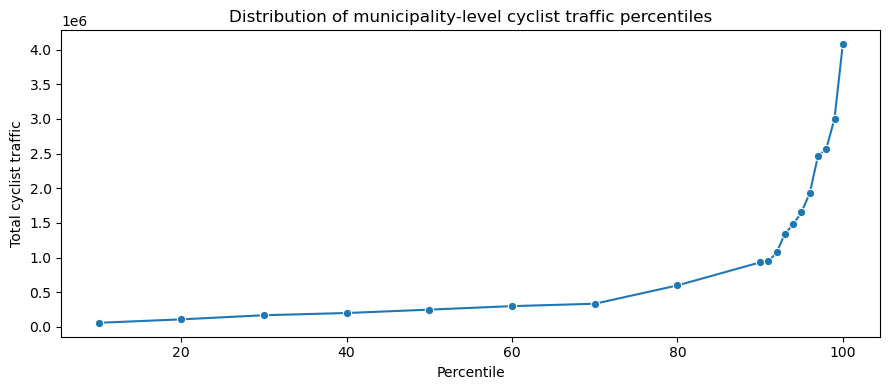

In [82]:
# Jan 2025 - Mar 2026 hourly traffic and city-level analysis

def create_traffic_2025_2026(df, start_date="2025-01-01", end_date="2026-03-31"):
    """
    Create hourly aggregated cyclist traffic from Jan 2025 to Mar 2026.
    """

    temp = df.copy()

    # Keep only cyclists and selected period
    temp = temp[
        (temp["type"].astype(str).str.upper() == "FIETSERS") &
        (temp["van"] >= pd.to_datetime(start_date)) &
        (temp["van"] <= pd.to_datetime(end_date))
    ].copy()

    # Create time features
    if "date" not in temp.columns:
        temp["date"] = temp["van"].dt.date

    if "year" not in temp.columns:
        temp["year"] = temp["van"].dt.year

    if "month" not in temp.columns:
        temp["month"] = temp["van"].dt.month

    if "hour" not in temp.columns:
        temp["hour"] = temp["van"].dt.hour

    if "dow" not in temp.columns:
        temp["dow"] = temp["van"].dt.day_name()

    if "weekend" not in temp.columns:
        temp["weekend"] = temp["dow"].isin(["Saturday", "Sunday"]).astype(int)

    # Aggregate 15-minute observations to hourly observations
    traffic_2025_2026 = (
        temp.groupby(
            ["siteid", "richting", "date", "year", "month", "hour", "dow", "weekend"],
            as_index=False
        )["aantal"]
        .sum()
        .rename(columns={"aantal": "total_traffic"})
    )

    return traffic_2025_2026


# Create Jan 2025 - Mar 2026 hourly aggregated traffic
traffic_2025_2026 = create_traffic_2025_2026(traffic_cleaned_all)

print("Hourly aggregated observations:", traffic_2025_2026.shape[0])
print("Unique sites:", traffic_2025_2026["siteid"].nunique())
print("Time range:", traffic_2025_2026["date"].min(), "to", traffic_2025_2026["date"].max())

display(traffic_2025_2026.head())


# Merge traffic with site metadata
traffic_2025_2026_merged = traffic_2025_2026.merge(
    sites_df[["siteid", "gemeente", "naam", "district"]],
    on="siteid",
    how="left"
)

traffic_2025_2026_merged["gemeente"] = traffic_2025_2026_merged["gemeente"].fillna("Unknown")

display(traffic_2025_2026_merged.head())


# Total cyclist traffic by municipality/city
city_traffic = (
    traffic_2025_2026_merged
    .groupby("gemeente")["total_traffic"]
    .sum()
    .reset_index(name="total_traffic")
    .sort_values("total_traffic", ascending=False)
)

display(city_traffic.head(10))

display(city_traffic.tail(10))


# 4. Plot top 15 municipalities
plt.figure(figsize=(10, 5))
sns.barplot(
    data=city_traffic.head(15),
    x="total_traffic",
    y="gemeente"
)
plt.title("Top 15 municipalities by cyclist traffic (Jan 2025 - Mar 2026)")
plt.xlabel("Total cyclist traffic")
plt.ylabel("Municipality")
plt.tight_layout()
plt.show()


# Top and bottom municipalities
top_cities = city_traffic.head(5)
bottom_cities = city_traffic.tail(5)
display(top_cities)
display(bottom_cities)


# 6. Show counting sites inside top municipalities
top_city_names = top_cities["gemeente"].tolist()

top_city_sites = (
    sites_df[sites_df["gemeente"].isin(top_city_names)]
    [["siteid", "naam", "gemeente", "district"]]
    .sort_values(["gemeente", "siteid"])
)

display(top_city_sites)


# Percentile distribution of municipality-level traffic
percentile_values = [
    10, 20, 30, 40, 50, 60, 70, 80,
    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100
]

city_percentiles = pd.DataFrame({
    "percentile": percentile_values,
    "traffic_value": [
        city_traffic["total_traffic"].quantile(p / 100)
        for p in percentile_values
    ]
})

display(city_percentiles)

plt.figure(figsize=(9, 4))
sns.lineplot(
    data=city_percentiles,
    x="percentile",
    y="traffic_value",
    marker="o"
)
plt.title("Distribution of municipality-level cyclist traffic percentiles")
plt.xlabel("Percentile")
plt.ylabel("Total cyclist traffic")
plt.tight_layout()
plt.show()

#### 1.3.3.2. Comparing weekday and weekend cyclist counts on site level

This plot compares weekday and weekend cyclist counts for the top traffic sites in March 2026. It is used as a supporting exploration to show whether the busiest sites are mainly driven by weekday or weekend traffic.


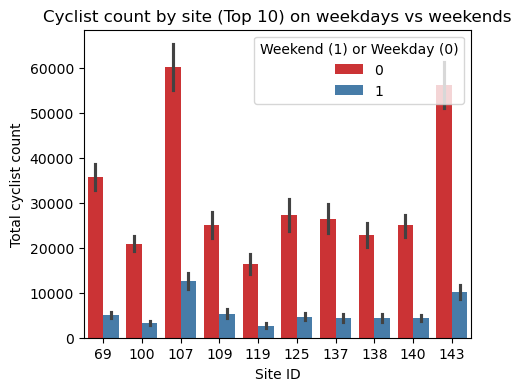

Weekday traffic: 967,851
Weekend traffic: 187,852


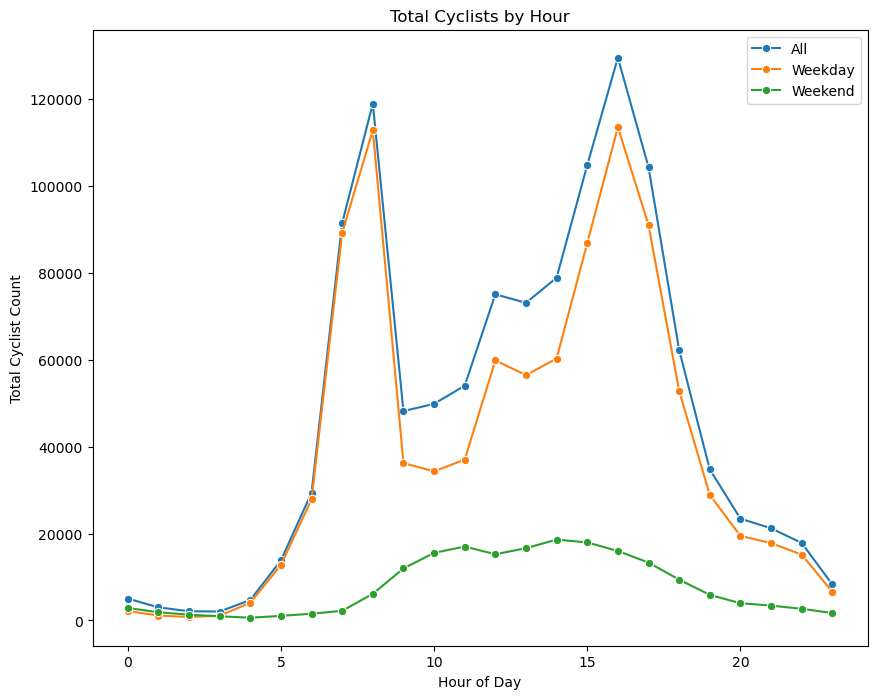

Insight: The highest cyclist traffic occurs around 16:00.
If the highest values appear in the morning and late afternoon, this may indicate commuting-related cycling patterns.


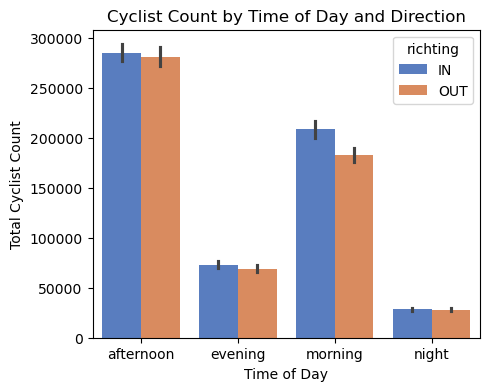

In [83]:
# 1. Total cyclist count per weekday vs weekend for top 10 sites

top10_sites = traffic_agg_rich.groupby('siteid')['aantal'].sum().sort_values(ascending=False).head(10).index
top10_df = traffic_agg_rich[traffic_agg_rich['siteid'].isin(top10_sites)]

plt.figure(figsize=(5, 4))
sns.barplot(
    data=top10_df, 
    x='siteid', 
    y='aantal', 
    hue='weekend', 
    estimator=sum,
    hue_order=[0, 1],
    palette='Set1'
)
plt.title('Cyclist count by site (Top 10) on weekdays vs weekends')
plt.xlabel('Site ID')
plt.ylabel('Total cyclist count')
plt.legend(title='Weekend (1) or Weekday (0)')
plt.show()

# Compare total cyclist traffic between weekdays and weekends.
weekday_weekend_total = traffic_agg_rich.groupby("weekend")["aantal"].sum()
weekday_total = weekday_weekend_total.get(0, 0)
weekend_total = weekday_weekend_total.get(1, 0)

print(f"Weekday traffic: {weekday_total:,.0f}")
print(f"Weekend traffic: {weekend_total:,.0f}") # Traffic is higher during the weekdays

# 2. Total count by hour (all, weekday, weekend)

plt.figure(figsize=(10, 8))
# All days
sns.lineplot(
    data=traffic_agg_rich.groupby('hour')['aantal'].sum().reset_index(), 
    x='hour', y='aantal', marker='o', label='All'
)
# Weekdays
sns.lineplot(
    data=traffic_agg_rich[traffic_agg_rich['weekend']==0].groupby('hour')['aantal'].sum().reset_index(),
    x='hour', y='aantal', marker='o', label='Weekday'
)
# Weekends
sns.lineplot(
    data=traffic_agg_rich[traffic_agg_rich['weekend']==1].groupby('hour')['aantal'].sum().reset_index(),
    x='hour', y='aantal', marker='o', label='Weekend'
)
plt.title('Total Cyclists by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Total Cyclist Count')
plt.legend()
plt.show()

# Insight: find the busiest hour.
peak_hour = traffic_agg_rich.groupby("hour")["aantal"].sum().idxmax()
print(f"Insight: The highest cyclist traffic occurs around {peak_hour}:00.")
print("If the highest values appear in the morning and late afternoon, this may indicate commuting-related cycling patterns.")

# 3. Cyclist count by direction and time of day

plt.figure(figsize=(5, 4))
sns.barplot(
    data=traffic_agg_rich, 
    x='tod', 
    y='aantal', 
    hue='richting', 
    estimator=sum,
    palette='muted'
)
plt.title('Cyclist Count by Time of Day and Direction')
plt.xlabel('Time of Day')
plt.ylabel('Total Cyclist Count')
plt.show()

# Identify the busiest time-of-day group and dominant direction.
highest_tod = traffic_agg_rich.groupby('tod')['aantal'].sum().idxmax()
highest_direction = traffic_agg_rich.groupby('richting')['aantal'].sum().idxmax() # The highest cycling volume occurs around 16pm


#### 1.3.3.3. Mean traffic by hour of day

This analysis answers the time-level question about how cyclist traffic changes across the hours of a day. It uses the Jan 2025 - Mar 2026 hourly dataset and identifies the hours with the highest average cyclist traffic.


,hour,mean_traffic
0,0,1.488301
1,1,1.027782
2,2,0.730545
3,3,0.616367
4,4,1.167409
5,5,3.219705
6,6,6.468611
7,7,18.162710
8,8,23.708129
9,9,12.193016


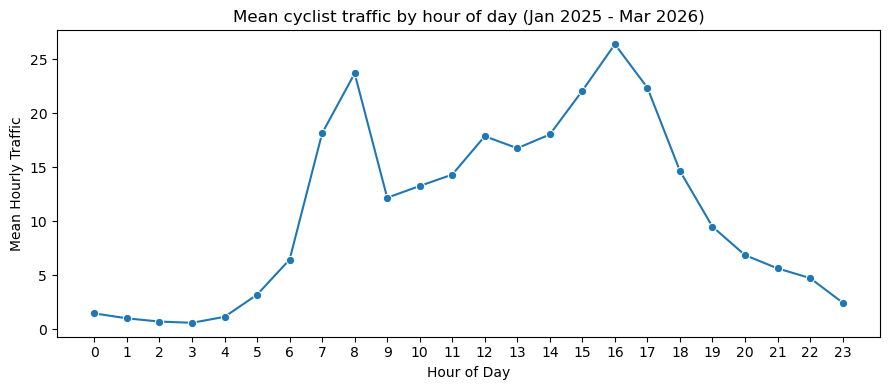

In [84]:
# Mean cyclist traffic by hour of day

# 1. Mean cyclist traffic by hour of day
hourly_mean = (
    traffic_2025_2026
    .groupby("hour")["total_traffic"]
    .mean()
    .reset_index(name="mean_traffic")
)

display(hourly_mean)

plt.figure(figsize=(9, 4))
sns.lineplot(
    data=hourly_mean,
    x="hour",
    y="mean_traffic",
    marker="o"
)
plt.title("Mean cyclist traffic by hour of day (Jan 2025 - Mar 2026)")
plt.xlabel("Hour of Day")
plt.ylabel("Mean Hourly Traffic")
plt.xticks(range(0, 24))
plt.tight_layout()
plt.show()

#### 1.3.3.4. Rush hours versus other hours

This cell groups hours into morning rush, afternoon rush, and other hours. The purpose is to compare whether rush-hour traffic is meaningfully higher than the rest of the day.


,time_period,mean_traffic
0,Afternoon rush,21.150107
1,Morning rush,18.021254
2,Other hours,8.133797


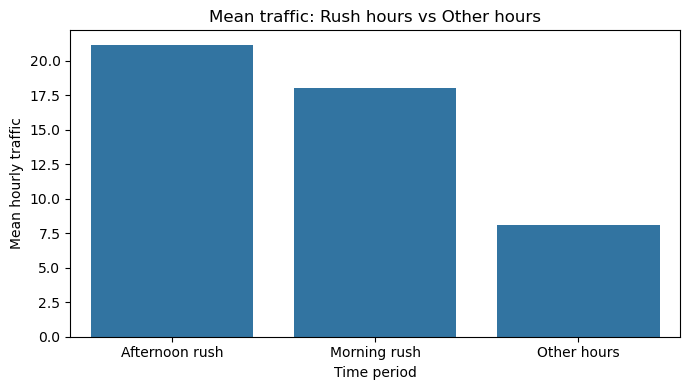

In [85]:
# 2. Compare rush hours with other hours
traffic_2025_2026["time_period"] = "Other hours"

traffic_2025_2026.loc[
    traffic_2025_2026["hour"].isin([7, 8, 9]),
    "time_period"
] = "Morning rush"

traffic_2025_2026.loc[
    traffic_2025_2026["hour"].isin([16, 17, 18]),
    "time_period"
] = "Afternoon rush"

rush_summary = (
    traffic_2025_2026
    .groupby("time_period")["total_traffic"]
    .mean()
    .reset_index(name="mean_traffic")
    .sort_values("mean_traffic", ascending=False)
)

display(rush_summary)

plt.figure(figsize=(7, 4))
sns.barplot(
    data=rush_summary,
    x="time_period",
    y="mean_traffic"
)
plt.title("Mean traffic: Rush hours vs Other hours")
plt.xlabel("Time period")
plt.ylabel("Mean hourly traffic")
plt.tight_layout()
plt.show()

#### 1.3.3.5. Weekday versus weekend traffic regarding mean cyclist traffic

This analysis compares mean cyclist traffic on weekdays and weekends for the Jan 2025–Mar 2026 period. It helps distinguish regular weekday travel patterns from weekend cycling behaviour.


,weekend,mean_traffic,day_type
0,0,12.262691,Weekday
1,1,7.802802,Weekend


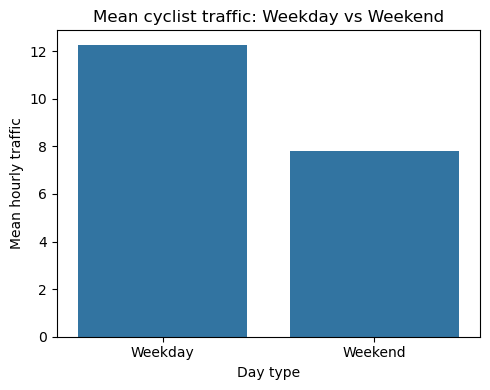

In [86]:
# 3. Mean cyclist traffic: weekday vs weekend
daytype_mean = (
    traffic_2025_2026
    .groupby("weekend")["total_traffic"]
    .mean()
    .reset_index(name="mean_traffic")
)

daytype_mean["day_type"] = daytype_mean["weekend"].map({
    0: "Weekday",
    1: "Weekend"
})

display(daytype_mean)

plt.figure(figsize=(5, 4))
sns.barplot(
    data=daytype_mean,
    x="day_type",
    y="mean_traffic"
)
plt.title("Mean cyclist traffic: Weekday vs Weekend")
plt.xlabel("Day type")
plt.ylabel("Mean hourly traffic")
plt.tight_layout()
plt.show()

#### 1.3.3.6. Hour-by-day heatmap

The heatmap shows how mean cyclist traffic differs by hour and day of week. It provides a compact view of daily and weekly patterns, making it easier to identify peak periods and lower-traffic periods.


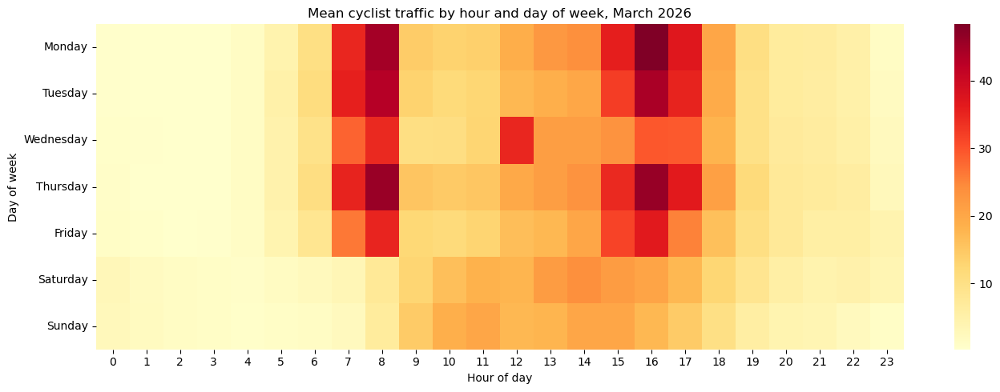

In [87]:
# 4. Heatmap: mean cyclist traffic by hour and day of week in March 2026
march2026 = traffic_2025_2026[
    (traffic_2025_2026["year"] == 2026) &
    (traffic_2025_2026["month"] == 3)
].copy()

heatmap_data = (
    march2026
    .groupby(["dow", "hour"])["total_traffic"]
    .mean()
    .reset_index()
)

heatmap_pivot = heatmap_data.pivot_table(
    index="dow",
    columns="hour",
    values="total_traffic",
    aggfunc="mean"
)

day_order = [
    "Monday", "Tuesday", "Wednesday", "Thursday",
    "Friday", "Saturday", "Sunday"
]

heatmap_pivot = heatmap_pivot.reindex(day_order)

plt.figure(figsize=(14, 5))
sns.heatmap(heatmap_pivot, cmap="YlOrRd")
plt.title("Mean cyclist traffic by hour and day of week, March 2026")
plt.xlabel("Hour of day")
plt.ylabel("Day of week")
plt.tight_layout()
plt.show()


### City-level EDA by grouping municipalities

#### 1.3.4.1. Municipality-to-city grouping

This cell assigns municipalities to broader city groups for city-level EDA. The grouping is used for exploratory comparison across larger city areas; it should be interpreted as a practical grouping rather than an official administrative classification.


In [ ]:
city_hub_mapping = {
    'municipality': [
        'Aalst', 'Aalter', 'Aarschot', 'Ardooie', 'As', 'Asse', 'Balen', 'Beersel', 
        'Beveren', 'Bilzen', 'Brasschaat', 'Brecht', 'Bree', 'Brugge', 'Deinze', 
        'Dendermonde', 'Dessel', 'Diest', 'Evergem', 'Geel', 'Genk', 'Gent', 
        'Halle', 'Hamme', 'Hasselt', 'Heers', 'Heist-op-den-Berg', 'Herent', 
        'Herentals', 'Herk-de-Stad', 'Houthalen-Helchteren', 'Ieper', 'Izegem', 
        'Kampenhout', 'Kortrijk', 'Kraainem', 'Lanaken', 'Leuven', 'Lier', 
        'Lille', 'Lokeren', 'Lommel', 'Lummen', 'Maaseik', 'Maasmechelen', 
        'Machelen', 'Malle', 'Mechelen', 'Meise', 'Melle', 'Meulebeke', 
        'Nazareth', 'Nieuwpoort', 'Nijlen', 'Oostende', 'Peer', 'Pelt', 
        'Pepingen', 'Sint-Pieters-Leeuw', 'Tienen', 'Tongeren', 'Torhout', 
        'Vilvoorde', 'Wemmel', 'Wervik', 'Westerlo', 'Zaventem', 'Zele', 'Zemst',
        'District Vilvoorde-gewestwegen', 'District Leuven'
    ],
    'city': [
        'Aalst', 'Gent', 'Leuven', 'Roeselare', 'Genk', 'Halle-Vilvoorde', 'Turnhout', 'Halle-Vilvoorde',
        'Sint-Niklaas', 'Tongeren', 'Antwerp', 'Antwerp', 'Maaseik', 'Brugge', 'Gent',
        'Dendermonde', 'Turnhout', 'Leuven', 'Gent', 'Turnhout', 'Genk', 'Gent',
        'Halle', 'Dendermonde', 'Hasselt', 'Tongeren', 'Mechelen', 'Leuven',
        'Turnhout', 'Hasselt', 'Hasselt', 'Ieper', 'Roeselare',
        'Leuven', 'Kortrijk', 'Halle-Vilvoorde', 'Maastricht-Border', 'Leuven', 'Antwerp',
        'Turnhout', 'Sint-Niklaas', 'Maaseik', 'Hasselt', 'Maaseik', 'Maaseik',
        'Halle-Vilvoorde', 'Antwerp', 'Mechelen', 'Halle-Vilvoorde', 'Gent', 'Roeselare',
        'Gent', 'Veurne', 'Mechelen', 'Oostende', 'Maaseik', 'Maaseik',
        'Halle-Vilvoorde', 'Halle-Vilvoorde', 'Tienen', 'Tongeren', 'Brugge',
        'Vilvoorde', 'Halle-Vilvoorde', 'Kortrijk', 'Turnhout', 'Zaventem', 'Dendermonde', 'Mechelen',
        'Vilvoorde', 'Leuven'
    ]
}

df_mapping = pd.DataFrame(city_hub_mapping)

# Add grouped city labels to the traffic table
traffic_city_grouped = traffic_2025_2026_merged.copy()

# Clean municipality names and fix the unknown municipality.
# The unknown municipality was manually identified as Machelen after checking the site coordinates.
traffic_city_grouped["gemeente"] = (
    traffic_city_grouped["gemeente"]
    .fillna("Machelen")
    .astype(str)
    .str.strip()
    .replace({
        "Unknown": "Machelen",
        "nan": "Machelen",
        "None": "Machelen"
    })
)

# Merge municipality-to-city mapping
traffic_city_grouped = traffic_city_grouped.merge(
    df_mapping,
    left_on="gemeente",
    right_on="municipality",
    how="left"
)

# Check unmapped municipalities after the correction and merge
unmapped_municipalities = (
    traffic_city_grouped.loc[
        traffic_city_grouped["city"].isna(),
        "gemeente"
    ]
    .drop_duplicates()
    .sort_values()
)

print("Number of city groups:", traffic_city_grouped["city"].nunique())
print("Number of unmapped municipalities:", len(unmapped_municipalities))
display(pd.DataFrame({"unmapped_municipality": unmapped_municipalities}))

display(traffic_city_grouped.head())

Number of city groups: 24
Number of unmapped municipalities: 0


,unmapped_municipality


,siteid,richting,date,year,month,hour,dow,weekend,total_traffic,gemeente,naam,district,municipality,city
0,1,IN,2025-01-01,2025,1,0,Wednesday,0,1.0,Machelen,Machelen,AWV212,Machelen,Halle-Vilvoorde
1,1,IN,2025-01-01,2025,1,1,Wednesday,0,1.0,Machelen,Machelen,AWV212,Machelen,Halle-Vilvoorde
2,1,IN,2025-01-01,2025,1,2,Wednesday,0,2.0,Machelen,Machelen,AWV212,Machelen,Halle-Vilvoorde
3,1,IN,2025-01-01,2025,1,3,Wednesday,0,1.0,Machelen,Machelen,AWV212,Machelen,Halle-Vilvoorde
4,1,IN,2025-01-01,2025,1,4,Wednesday,0,0.0,Machelen,Machelen,AWV212,Machelen,Halle-Vilvoorde


#### 1.3.4.2. Top and bottom city groups

This cell summarizes total cyclist traffic by grouped city area. It identifies the city groups with the highest and lowest traffic volumes during the Jan 2025–Mar 2026 period.


,city,total_traffic,mean_hourly_traffic,num_sites,num_municipalities,num_observations
11,Leuven,5555368.0,19.860460,15,6,279720
8,Hasselt,3142370.0,18.740950,8,4,167674
10,Kortrijk,3008404.0,20.496845,7,2,146774
5,Gent,2709175.0,10.767872,12,6,251598
20,Turnhout,2539350.0,8.648894,14,6,293604
14,Mechelen,2224198.0,15.172711,7,4,146592
21,Veurne,1805964.0,21.529302,4,1,83884
2,Brugge,1508015.0,10.060140,8,2,149900
12,Maaseik,1399030.0,6.065282,11,6,230662
3,Dendermonde,1338831.0,12.783155,5,3,104734


Top city groups by total cyclist traffic:


,city,total_traffic,mean_hourly_traffic,num_sites,num_municipalities,num_observations
11,Leuven,5555368.0,19.860460,15,6,279720
8,Hasselt,3142370.0,18.740950,8,4,167674
10,Kortrijk,3008404.0,20.496845,7,2,146774
5,Gent,2709175.0,10.767872,12,6,251598
20,Turnhout,2539350.0,8.648894,14,6,293604


Bottom city groups by total cyclist traffic:


,city,total_traffic,mean_hourly_traffic,num_sites,num_municipalities,num_observations
22,Vilvoorde,355873.0,4.992607,5,2,71280
13,Maastricht-Border,278182.0,6.642994,2,1,41876
19,Tongeren,264916.0,3.161364,4,3,83798
9,Ieper,261103.0,6.322719,2,1,41296
6,Halle,26044.0,1.241254,1,1,20982


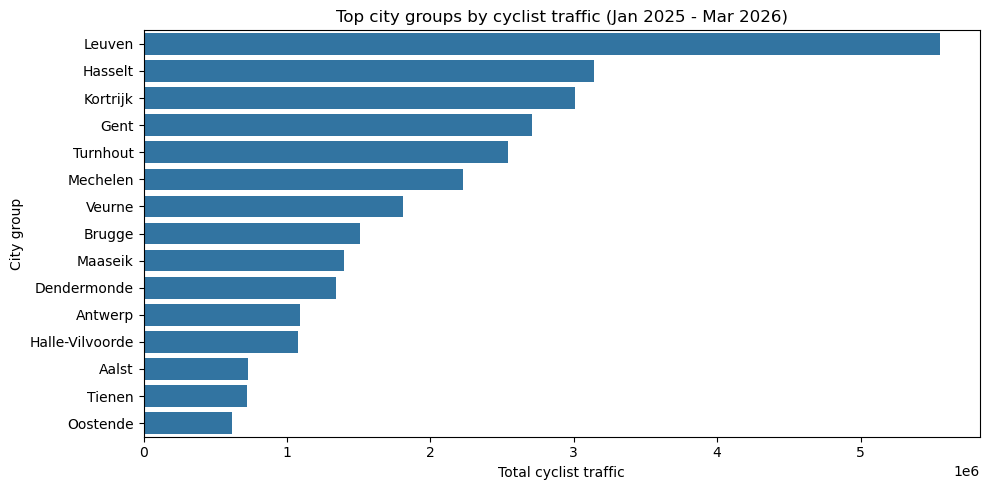

In [92]:
# Determine cities with highest and lowest traffic
city_group_summary = (
    traffic_city_grouped
    .groupby("city")
    .agg(
        total_traffic=("total_traffic", "sum"),
        mean_hourly_traffic=("total_traffic", "mean"),
        num_sites=("siteid", "nunique"),
        num_municipalities=("gemeente", "nunique"),
        num_observations=("total_traffic", "size")
    )
    .reset_index()
    .sort_values("total_traffic", ascending=False)
)

display(city_group_summary)

print("Top city groups by total cyclist traffic:")
top_city_groups = city_group_summary.head(5)
display(top_city_groups)

print("Bottom city groups by total cyclist traffic:")
bottom_city_groups = city_group_summary.tail(5)
display(bottom_city_groups)

plt.figure(figsize=(10, 5))
sns.barplot(
    data=city_group_summary.head(15),
    x="total_traffic",
    y="city"
)
plt.title("Top city groups by cyclist traffic (Jan 2025 - Mar 2026)")
plt.xlabel("Total cyclist traffic")
plt.ylabel("City group")
plt.tight_layout()
plt.show()

#### 1.3.4.3. Municipalities inside top city groups

This cell lists which municipalities belong to the highest-traffic city groups. This gives more spatial context than only reporting site IDs or city group names.


In [93]:
# Exploring municipalities inside the top city groups
top_city_group_names = top_city_groups["city"].tolist()

top_city_group_municipalities = (
    traffic_city_grouped[traffic_city_grouped["city"].isin(top_city_group_names)]
    .groupby(["city", "gemeente"])
    .agg(
        total_traffic=("total_traffic", "sum"),
        num_sites=("siteid", "nunique")
    )
    .reset_index()
    .sort_values(["city", "total_traffic"], ascending=[True, False])
)

display(top_city_group_municipalities)

# Top individual sites in the top city groups, with names and municipalities.
# This avoids interpreting traffic using only anonymous site IDs such as 107 or 143.
top_sites_in_top_city_groups = (
    traffic_city_grouped[traffic_city_grouped["city"].isin(top_city_group_names)]
    .groupby(["city", "gemeente", "siteid", "naam"])
    .agg(total_traffic=("total_traffic", "sum"))
    .reset_index()
    .sort_values("total_traffic", ascending=False)
    .head(20)
)

display(top_sites_in_top_city_groups)

,city,gemeente,total_traffic,num_sites
3,Gent,Gent,1526891.0,4
2,Gent,Evergem,331046.0,2
0,Gent,Aalter,294164.0,1
4,Gent,Melle,281445.0,2
1,Gent,Deinze,249613.0,2
5,Gent,Nazareth,26016.0,1
6,Hasselt,Hasselt,2563041.0,3
7,Hasselt,Herk-de-Stad,326040.0,2
8,Hasselt,Houthalen-Helchteren,177378.0,1
9,Hasselt,Lummen,75911.0,2


,city,gemeente,siteid,naam,total_traffic
40,Leuven,Leuven,107,leuven totem,2109813.0
24,Kortrijk,Kortrijk,143,Eco Display Classic Budastraat,1521333.0
37,Leuven,Leuven,69,Leuven teller 1,1080606.0
14,Hasselt,Hasselt,140,Hasselt ring,883228.0
12,Hasselt,Hasselt,137,Hasselt-Kempische brug,869542.0
13,Hasselt,Hasselt,138,Hasselt-Kempische brug,810271.0
7,Gent,Gent,119,Gent teller 2,470242.0
5,Gent,Gent,13,Gent,430743.0
6,Gent,Gent,118,Gent teller 1,430419.0
39,Leuven,Leuven,77,Leuven teller 2,403021.0


#### 1.3.4.4. Percentile distribution of city-level traffic

This analysis shows how cyclist traffic is distributed across city groups. The percentile table helps assess whether traffic is evenly spread or concentrated in a small number of high-traffic cities.


,percentile,traffic_value
0,10,268895.80
1,20,413266.60
2,30,521767.80
3,40,636966.40
4,50,902756.00
5,60,1289829.60
6,70,1537809.90
7,80,2350258.80
8,90,2918635.30
9,91,2987457.97


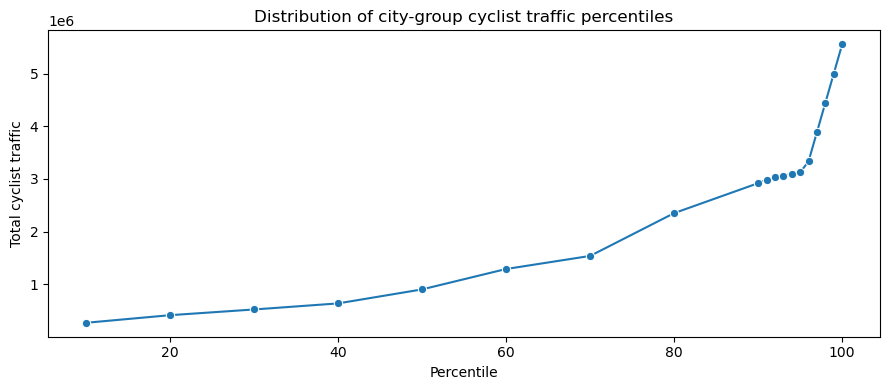

In [94]:
# Percentile distribution of city-level traffic
percentile_values = [
    10, 20, 30, 40, 50, 60, 70, 80,
    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100
]

city_group_percentiles = pd.DataFrame({
    "percentile": percentile_values,
    "traffic_value": [
        city_group_summary["total_traffic"].quantile(p / 100)
        for p in percentile_values
    ]
})

display(city_group_percentiles)

plt.figure(figsize=(9, 4))
sns.lineplot(
    data=city_group_percentiles,
    x="percentile",
    y="traffic_value",
    marker="o"
)
plt.title("Distribution of city-group cyclist traffic percentiles")
plt.xlabel("Percentile")
plt.ylabel("Total cyclist traffic")
plt.tight_layout()
plt.show()

### 1.3.4. Visualization for PyShiny

We made use of PyShiny to visualize total traffic in Flanders in Q4 2025 by direction, municipality, and daytype.

#### 1.3.4.1. Preparing the PyShiny visualization dataset

This cell creates a smaller Q4 2025 aggregated dataset for the PyShiny dashboard. The full traffic dataset is too large for smooth interactive visualization, so the dashboard uses hourly aggregated traffic for October to December 2025.


In [88]:
# Create traffic files for Q4 2025 for visualization
traffic_files = [
    "D:/KUL MSDS 1/mda_project/data/traffic/data-2025-10.csv",
    "D:/KUL MSDS 1/mda_project/data/traffic/data-2025-11.csv",
    "D:/KUL MSDS 1/mda_project/data/traffic/data-2025-12.csv",
]

output_path = "D:/KUL MSDS 1/mda_project/data/traffic_q4_2025_aggregated.csv"

traffic_columns = ["siteid", "richting", "type", "van", "tot", "aantal"]

# Process each monthly file
all_agg = []

for file in traffic_files:
    print(f"\nProcessing {os.path.basename(file)}...")

    # Read raw file without header
    df = pd.read_csv(
        file,
        header=None,
        names=traffic_columns
    )

    # Convert timestamps
    df["van"] = pd.to_datetime(df["van"], errors="coerce")
    df["tot"] = pd.to_datetime(df["tot"], errors="coerce")

    # Remove invalid timestamp rows
    df = df[df["van"].notna()]

    # Convert count to numeric
    df["aantal"] = pd.to_numeric(df["aantal"], errors="coerce")
    df = df[df["aantal"].notna()]

    # Keep only cyclist rows
    df = df[df["type"].astype(str).str.upper().eq("FIETSERS")]

    # Keep only Q4-2025
    df = df[(df["van"] >= "2025-10-01") & (df["van"] < "2026-01-01")]

    # Create time features
    df["year"] = df["van"].dt.year
    df["month"] = df["van"].dt.month
    df["day"] = df["van"].dt.day
    df["hour"] = df["van"].dt.hour
    df["weekday"] = df["van"].dt.day_name()
    df["is_weekend"] = df["van"].dt.dayofweek >= 5

    # Aggregate to hourly level per site and direction
    agg = (
        df.groupby(
            [
                "siteid",
                "richting",
                "year",
                "month",
                "day",
                "hour",
                "weekday",
                "is_weekend",
            ],
            as_index=False
        )["aantal"]
        .sum()
        .rename(columns={"aantal": "total_traffic"})
    )

    print("Aggregated shape:", agg.shape)

    all_agg.append(agg)

# Combine all monthly aggregations

traffic_agg = pd.concat(all_agg, ignore_index=True)

## Re-aggregate in case duplicate groups exist across files
traffic_agg = (
    traffic_agg.groupby(
        [
            "siteid",
            "richting",
            "year",
            "month",
            "day",
            "hour",
            "weekday",
            "is_weekend",
        ],
        as_index=False
    )["total_traffic"]
    .sum()
)

# Save final aggregated file

traffic_agg.to_csv(output_path, index=False)

print("Rows:", len(traffic_agg))
print(traffic_agg.head())


Processing data-2025-10.csv...
Aggregated shape: (211478, 9)

Processing data-2025-11.csv...
Aggregated shape: (206874, 9)

Processing data-2025-12.csv...
Aggregated shape: (212220, 9)
Rows: 630572
   siteid richting  year  month  day  hour    weekday  is_weekend  \
0       1       IN  2025     10    1     0  Wednesday       False   
1       1       IN  2025     10    1     1  Wednesday       False   
2       1       IN  2025     10    1     2  Wednesday       False   
3       1       IN  2025     10    1     3  Wednesday       False   
4       1       IN  2025     10    1     4  Wednesday       False   

   total_traffic  
0            1.0  
1            1.0  
2            0.0  
3            2.0  
4            3.0  
